<a href="https://colab.research.google.com/github/AybarsCebi/Crowd-Counting-with-Image-Processing/blob/main/AMRNet_FinalMAE102_RMSE.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import numpy as np
import cv2
import os
import matplotlib.pyplot as plt

from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.models as models

class CBAMModule(nn.Module):
    def __init__(self, in_channels, reduction=16):
        super().__init__()
        self.channel_avg_pool = nn.AdaptiveAvgPool2d(1)
        self.channel_max_pool = nn.AdaptiveMaxPool2d(1)
        self.shared_mlp = nn.Sequential(
            nn.Linear(in_channels, in_channels // reduction, bias=False),
            nn.ReLU(),
            nn.Linear(in_channels // reduction, in_channels, bias=False),
        )
        self.sigmoid_channel = nn.Sigmoid()
        self.spatial_conv = nn.Sequential(
            nn.Conv2d(2, 8, kernel_size=3, padding=1, bias=False),
            nn.ReLU(),
            nn.Conv2d(8, 1, kernel_size=3, padding=1, bias=False),
        )
        self.sigmoid_spatial = nn.Sigmoid()

    def forward(self, x):
        b, c, _, _ = x.size()
        avg = self.channel_avg_pool(x).view(b, c)
        mx  = self.channel_max_pool(x).view(b, c)
        avg_out = self.shared_mlp(avg).view(b, c, 1, 1)
        mx_out  = self.shared_mlp(mx ).view(b, c, 1, 1)
        x = x * self.sigmoid_channel(avg_out + mx_out)

        avg_sp = x.mean(dim=1, keepdim=True)
        mx_sp, _ = x.max(dim=1, keepdim=True)
        x = x * self.sigmoid_spatial(self.spatial_conv(torch.cat([avg_sp, mx_sp], dim=1)))
        return x

class AMRNet_ResNet50(nn.Module):
    def __init__(self):
        super().__init__()
        # Dilation in the ResNet-50
        resnet = models.resnet50(
            pretrained=True,
            replace_stride_with_dilation=[False, False, True]
        )

        self.initial = nn.Sequential(
            resnet.conv1, resnet.bn1, resnet.relu, resnet.maxpool
        )
        # Scale
        self.scale1 = resnet.layer1  # 256
        self.scale2 = resnet.layer2  # 512, ↓8
        self.scale3 = resnet.layer3  # 1024, ↓16

        self.att1 = CBAMModule(256)
        self.att2 = CBAMModule(512)
        self.att3 = CBAMModule(1024)

        # Auxiliary heads
        self.head1 = nn.Conv2d(256, 1, kernel_size=1)
        self.head2 = nn.Conv2d(512, 1, kernel_size=1)
        self.head3 = nn.Conv2d(1024,1, kernel_size=1)

        # Fusion
        self.fusion_conv = nn.Conv2d(256 + 512 + 1024, 256, kernel_size=1)
        self.density_map = nn.Sequential(
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 64,  kernel_size=3, padding=1),
            nn.ReLU(),
            nn.Conv2d(64,   1,   kernel_size=1),
        )

    def forward(self, x):
        x = self.initial(x)
        x1 = self.att1(self.scale1(x))
        x2 = self.att2(self.scale2(x1))
        x3 = self.att3(self.scale3(x2))

        d1 = F.interpolate(self.head1(x1), size=x1.shape[2:], mode='bilinear', align_corners=False)
        d2 = F.interpolate(self.head2(x2), size=x1.shape[2:], mode='bilinear', align_corners=False)
        d3 = F.interpolate(self.head3(x3), size=x1.shape[2:], mode='bilinear', align_corners=False)

        x2u = F.interpolate(x2, size=x1.shape[2:], mode='bilinear', align_corners=False)
        x3u = F.interpolate(x3, size=x1.shape[2:], mode='bilinear', align_corners=False)
        fused = torch.cat([x1, x2u, x3u], dim=1)
        fused = self.fusion_conv(fused)

        final = self.density_map(fused)
        if self.training:
            return final, (d1, d2, d3)
        return final


In [ ]:
import scipy.io
import numpy as np
import cv2
import os

def generate_density_map(img_shape, points, sigma=15):
    """512x512 boyutunda yoğunluk haritası üretir."""
    density_map = np.zeros((512, 512), dtype=np.float32)

    for point in points:
        x, y = min(int(point[0]), 511), min(int(point[1]), 511)
        density_map[y, x] = 1

    density_map = cv2.GaussianBlur(density_map, (0, 0), sigma)
    if density_map.sum() > 0:
        density_map *= (len(points) / density_map.sum())
    return density_map

data_path = "/content/drive/MyDrive/CrowdCounting/dataset/validation_data/images"
gt_path = "/content/drive/MyDrive/CrowdCounting/dataset/validation_data/ground_truth"
output_dir = "/content/drive/MyDrive/CrowdCounting/dataset/validation_data/density_maps"

os.makedirs(output_dir, exist_ok=True)

for img_file in os.listdir(data_path):
    if not img_file.startswith("IMG_") or not img_file.endswith(".jpg"):
        continue

    img_path = os.path.join(data_path, img_file)

    img_number = img_file.replace("IMG_", "").replace(".jpg", "")
    gt_path_mat = os.path.join(gt_path, f"GT_IMG_{img_number}.mat")

    if not os.path.exists(gt_path_mat):
        print(f"Uyarı: {gt_path_mat} bulunamadı, atlanıyor.")
        continue


    mat = scipy.io.loadmat(gt_path_mat)
    points = mat["image_info"][0, 0][0, 0][0]

    img = cv2.imread(img_path)
    h, w = img.shape[:2]
    img_resized = cv2.resize(img, (512, 512))

    points_rescaled = points * [512 / w, 512 / h]

    density_map = generate_density_map(img_resized.shape, points_rescaled)

    npy_path = os.path.join(output_dir, img_file.replace("IMG_", "IMG_").replace(".jpg", ".npy"))
    np.save(npy_path, density_map)


In [ ]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

IMG_HEIGHT = 512
IMG_WIDTH = 512

# Train
train_transform = A.Compose([
    A.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1, p=1.0),
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
], additional_targets={'density_map': 'image'})

# Validation
val_transform = A.Compose([
    A.Normalize(mean=(0.485, 0.456, 0.406),
                std=(0.229, 0.224, 0.225)),
    ToTensorV2(),
], additional_targets={'density_map': 'image'})


/usr/local/lib/python3.11/dist-packages/albumentations/__init__.py:28: UserWarning: A new version of Albumentations is available: '2.0.7' (you have '2.0.6'). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()


In [ ]:
class CrowdDataset(Dataset):
    def __init__(self, image_dir, density_dir, transform=None):
        self.image_dir = image_dir
        self.density_dir = density_dir
        self.image_files = [f for f in os.listdir(image_dir) if f.endswith(".jpg")]
        self.transform = transform

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_path = os.path.join(self.image_dir, self.image_files[idx])
        density_path = os.path.join(self.density_dir, self.image_files[idx].replace(".jpg", ".npy"))

        image = cv2.imread(img_path)
        image = cv2.resize(image, (512, 512))
        image = image.astype(np.float32) / 255.0
        image = np.transpose(image, (2, 0, 1))

        density_map = np.load(density_path).astype(np.float32)
        density_map = np.expand_dims(density_map, axis=0)

        return torch.tensor(image), torch.tensor(density_map)


train_image_dir = "/content/drive/MyDrive/CrowdCounting/dataset/train_data/images"
train_density_dir = "/content/drive/MyDrive/CrowdCounting/dataset/train_data/density_maps"

val_image_dir = "/content/drive/MyDrive/CrowdCounting/dataset/validation_data/images"
val_density_dir = "/content/drive/MyDrive/CrowdCounting/dataset/validation_data/density_maps"


test_image_dir = "/content/drive/MyDrive/CrowdCounting/dataset/test_data/images"
test_density_dir = "/content/drive/MyDrive/CrowdCounting/dataset/test_data/density_maps"


train_dataset = CrowdDataset(train_image_dir, train_density_dir, transform=train_transform)
val_dataset = CrowdDataset(val_image_dir, val_density_dir, transform=val_transform)
test_dataset = CrowdDataset(test_image_dir, test_density_dir)

train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader   = torch.utils.data.DataLoader(val_dataset, batch_size=8, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

In [ ]:
images, densities = next(iter(train_loader))

print("Images shape:", images.shape)
print("Densities shape:", densities.shape)
print(len(train_loader))

images, densities = next(iter(train_loader))
print(images.shape, densities.shape)


Images shape: torch.Size([8, 3, 512, 512])
Densities shape: torch.Size([8, 1, 512, 512])
33
torch.Size([8, 3, 512, 512]) torch.Size([8, 1, 512, 512])


In [ ]:
import itertools
import copy
train_losses = []
val_losses = []
val_maes = []
val_mses = []

def grid_search(train_loader, val_loader, model_class, device,
                lr_values, wd_values, aux_weights,
                epochs=30, patience=10):

    best_mae = float('inf')
    best_config = None
    results = []

    for lr, wd, aux_w in itertools.product(lr_values, wd_values, aux_weights):
        print(f"\n=== Testing config: lr={lr}, weight_decay={wd}, aux_weight={aux_w} ===")

        model = model_class().to(device)
        optimizer = torch.optim.AdamW(model.parameters(), lr=lr, weight_decay=wd)

        train_losses.clear()
        val_losses.clear()
        val_maes.clear()
        val_mses.clear()

        _, _, val_maes_run, _ = train_model(
            model, train_loader, val_loader,
            optimizer, device,
            epochs=epochs,
            patience=patience,
            aux_weight=aux_w
        )

        final_mae = min(val_maes_run)
        results.append((lr, wd, aux_w, final_mae))

        if final_mae < best_mae:
            best_mae = final_mae
            best_config = (lr, wd, aux_w)
            print(f">>> New best config found with MAE = {best_mae:.2f}")

    print("\n=== Grid Search Summary ===")
    for r in results:
        print(f"lr={r[0]:.1e}, wd={r[1]:.1e}, aux={r[2]} -> MAE={r[3]:.2f}")

    print(f"\n>>> Best Config: lr={best_config[0]}, weight_decay={best_config[1]}, aux_weight={best_config[2]} (MAE={best_mae:.2f})")
    return best_config, results

lr_values       = [1e-4, 5e-5, 1e-5]
wd_values       = [1e-5, 1e-4]
aux_weights     = [0.1, 0.2, 0.3]

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


best_cfg, all_results = grid_search(
    train_loader=train_loader,
    val_loader=val_loader,
    model_class=AMRNet_ResNet50,
    device=device,
    lr_values=lr_values,
    wd_values=wd_values,
    aux_weights=aux_weights,
    epochs=20,
    patience=10
)



=== Testing config: lr=0.0001, weight_decay=1e-05, aux_weight=0.1 ===
Epoch 1/20 | Train Loss: 0.0016 | Val Loss: 0.0002 | Val MAE: 2976.49 | Val MSE: 8976062.17
Epoch 2/20 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 518.37 | Val MSE: 297528.95
Epoch 3/20 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 348.16 | Val MSE: 147344.39
Epoch 4/20 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 249.80 | Val MSE: 89784.25
Epoch 5/20 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 152.55 | Val MSE: 47358.49
Epoch 6/20 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 252.34 | Val MSE: 74865.32
Epoch 7/20 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 164.86 | Val MSE: 34247.90
Epoch 8/20 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 189.05 | Val MSE: 43812.35
Epoch 9/20 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 111.35 | Val MSE: 34583.51
Epoch 10/20 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 132.81 | Val MSE: 34800.69
Epoch 11/20 | Train Loss: 0.0000 

In [ ]:
import torch
import torch.nn.functional as F

def compute_test_mae(model, test_loader, device):
    model.eval()
    model.to(device)

    mae_sum = 0.0
    with torch.no_grad():
        for images, densities in test_loader:
            images   = images.to(device)
            densities= densities.to(device)

            outputs = model(images)
            if isinstance(outputs, tuple):
                outputs = outputs[0]

            if outputs.shape[-2:] != densities.shape[-2:]:
                outputs = F.interpolate(
                    outputs,
                    size=densities.shape[-2:],
                    mode='bilinear',
                    align_corners=False
                )

            pred_counts = outputs.sum(dim=[1,2,3])
            true_counts = densities.sum(dim=[1,2,3])

            mae_sum += torch.abs(pred_counts - true_counts).sum().item()

    avg_mae = mae_sum / len(test_loader.dataset)
    return avg_mae




In [ ]:
train_losses = []
val_losses = []
val_maes = []
val_mses = []

from torch.optim.lr_scheduler import ReduceLROnPlateau

def train_model(model, train_loader, val_loader, optimizer, device, epochs=80, patience=10, aux_weight=0.2):
    best_val_loss = float('inf')
    patience_counter = 0
    criterion = nn.MSELoss()

    for epoch in range(epochs):
        model.train()
        train_loss = 0

        for images, densities in train_loader:
            images    = images.to(device)
            densities = densities.to(device)

            optimizer.zero_grad()

            outputs = model(images)

            if isinstance(outputs, tuple):
                final, (d1, d2, d3) = outputs
            else:
                final = outputs
                d1 = d2 = d3 = None

            if final.shape[-2:] != densities.shape[-2:]:
                final = F.interpolate(final, size=densities.shape[-2:], mode='bilinear', align_corners=False)

            loss_main = criterion(final, densities)

            loss_aux = 0
            if d1 is not None:
                for d in (d1, d2, d3):
                    d = F.interpolate(d, size=densities.shape[-2:], mode='bilinear', align_corners=False)
                    loss_aux += criterion(d, densities)

            total_loss = loss_main + aux_weight * loss_aux
            total_loss.backward()
            optimizer.step()
            train_loss += total_loss.item()

        # Validation
        model.eval()
        val_loss = 0
        val_mae = 0
        val_mse_sum = 0

        with torch.no_grad():
            for images, densities in val_loader:
                images    = images.to(device)
                densities = densities.to(device)

                outputs = model(images)
                if isinstance(outputs, tuple):
                    outputs, _ = outputs

                if outputs.shape[-2:] != densities.shape[-2:]:
                    outputs = F.interpolate(outputs, size=densities.shape[-2:], mode='bilinear', align_corners=False)

                loss = criterion(outputs, densities)
                val_loss += loss.item()

                pred_counts = outputs.sum(dim=[1, 2, 3])
                true_counts = densities.sum(dim=[1, 2, 3])
                val_mae += torch.abs(pred_counts - true_counts).sum().item()

                val_mse_sum += ((pred_counts - true_counts) ** 2).sum().item()

        N = len(val_loader.dataset)
        avg_train_loss = train_loss / len(train_loader)
        avg_val_loss   = val_loss   / len(val_loader)
        avg_val_mae    = val_mae    / N
        # RMSE = sqrt( MSE ) = sqrt( toplam_kare_hata / N )
        avg_val_rmse   = (val_mse_sum / N) ** 0.5

        print(f"Epoch {epoch+1}/{epochs} | "
              f"Train Loss: {avg_train_loss:.4f} | "
              f"Val Loss: {avg_val_loss:.4f} | "
              f"Val MAE: {avg_val_mae:.2f} | "
              f"Val RMSE: {avg_val_rmse:.2f}")

        # its pixel based so in the output train and val loss looks zero but they are not we multiplied with 10.000 to see the values so they are decreasing. so another display could be Train Loss: {avg_train_loss*10000:.4f}

        if avg_val_loss <= best_val_loss:
            best_val_loss = avg_val_loss
            patience_counter = 0
            torch.save(model.state_dict(), "best_model.pt")
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping triggered at epoch {epoch+1}.")
                break

        train_losses.append(avg_train_loss)
        val_losses.append(avg_val_loss)
        val_maes.append(avg_val_mae)
        val_mses.append(avg_val_rmse)

    return train_losses, val_losses, val_maes, val_mses


device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = AMRNet_ResNet50().to(device)

optimizer = torch.optim.AdamW(model.parameters(), lr=1e-5, weight_decay=1e-4)
train_model(model, train_loader, val_loader, optimizer, device, epochs=120, patience=30, aux_weight=0.2)

model.load_state_dict(torch.load("best_model.pt"))
model.eval()
test_mae = compute_test_mae(model, test_loader, device)
print(f"Test MAE: {test_mae:.2f}")

/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 181MB/s]


Epoch 1/120 | Train Loss: 0.0010 | Val Loss: 0.0001 | Val MAE: 1990.61 | Val RMSE: 2050.80
Epoch 2/120 | Train Loss: 0.0002 | Val Loss: 0.0000 | Val MAE: 280.50 | Val RMSE: 449.54
Epoch 3/120 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 260.69 | Val RMSE: 441.31
Epoch 4/120 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 263.48 | Val RMSE: 416.40
Epoch 5/120 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 251.40 | Val RMSE: 406.37
Epoch 6/120 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 250.71 | Val RMSE: 380.38
Epoch 7/120 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 250.98 | Val RMSE: 361.28
Epoch 8/120 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 209.66 | Val RMSE: 339.59
Epoch 9/120 | Train Loss: 0.0001 | Val Loss: 0.0000 | Val MAE: 220.64 | Val RMSE: 318.68
Epoch 10/120 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 205.93 | Val RMSE: 286.61
Epoch 11/120 | Train Loss: 0.0000 | Val Loss: 0.0000 | Val MAE: 179.18 | Val RMSE: 265.75
Epoch 12/120 | Tr

In [ ]:
def evaluate_model(model, test_loader, device):
    model.eval()
    model.to(device)

    mae = 0.0
    mse = 0.0

    with torch.no_grad():
        for images, densities in test_loader:
            images = images.to(device)
            densities = densities.to(device)

            outputs = model(images)

            if outputs.shape[-2:] != densities.shape[-2:]:
                outputs = F.interpolate(outputs, size=densities.shape[-2:], mode='bilinear', align_corners=False)

            for i in range(images.size(0)):
                img = images[i].cpu()
                gt_density = densities[i].squeeze(0).cpu().numpy()
                pred_density = outputs[i].squeeze(0).cpu().numpy()

                gt_count = gt_density.sum()
                pred_count = pred_density.sum()
                print("MAE: ", abs(pred_count - gt_count).item())
                mae += abs(pred_count - gt_count).item()
                mse += ((pred_count - gt_count)**2).item()

    num_samples = len(test_loader.dataset)
    mae /= num_samples
    mse /= num_samples

    return mae, mse

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = AMRNet_ResNet50().to(device)
model.load_state_dict(torch.load("best_model.pt"))
model.eval()
test_mae, test_mse = evaluate_model(model, test_loader, device)
print(f"Test MAE: {test_mae:.2f} | Test MSE: {test_mse:.2f}")

MAE:  238.40771484375
MAE:  214.8372802734375
MAE:  4.8349761962890625
MAE:  67.9087142944336
MAE:  41.01097106933594
MAE:  228.85113525390625
MAE:  58.2054443359375
MAE:  140.955078125
MAE:  117.02618408203125
MAE:  130.72476196289062
MAE:  52.585296630859375
MAE:  318.1496887207031
MAE:  141.42108154296875
MAE:  41.37713623046875
MAE:  57.42414855957031
MAE:  50.126861572265625
MAE:  210.11737060546875
MAE:  56.674293518066406
MAE:  2.674530029296875
MAE:  235.97042846679688
MAE:  6.726806640625
MAE:  80.17999267578125
MAE:  19.528587341308594
MAE:  202.70806884765625
MAE:  1.961944580078125
MAE:  199.74481201171875
MAE:  22.8692626953125
MAE:  66.26593017578125
MAE:  123.906982421875
MAE:  289.8424072265625
MAE:  242.91357421875
MAE:  122.18374633789062
MAE:  570.418701171875
MAE:  70.51399230957031
MAE:  24.368804931640625
MAE:  27.1953125
MAE:  63.8232421875
MAE:  57.44941711425781
MAE:  6.514068603515625
MAE:  53.71649169921875
MAE:  31.19476318359375
MAE:  52.678314208984375
MAE

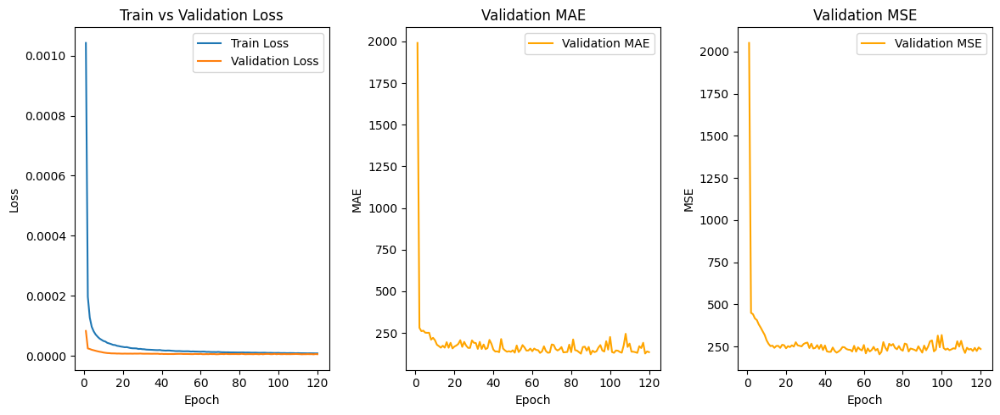

In [ ]:
import matplotlib.pyplot as plt

epochs_range = range(1, len(train_losses)+1)

plt.figure(figsize=(12, 5))

# Loss Graph
plt.subplot(1, 3, 1)
plt.plot(epochs_range, train_losses, label="Train Loss")
plt.plot(epochs_range, val_losses, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Train vs Validation Loss")
plt.legend()

# MAE Graph
plt.subplot(1, 3, 2)
plt.plot(epochs_range, val_maes, label="Validation MAE", color="orange")
plt.xlabel("Epoch")
plt.ylabel("MAE")
plt.title("Validation MAE")
plt.legend()

# MSE Graph
plt.subplot(1, 3, 3)
plt.plot(epochs_range, val_mses, label="Validation MSE", color="orange")
plt.xlabel("Epoch")
plt.ylabel("MSE")
plt.title("Validation MSE")
plt.legend()

plt.tight_layout()
plt.show()


In [ ]:
import cv2
import numpy as np
import torch
import matplotlib.pyplot as plt
import torch.nn.functional as F

def test_single_image(model, image_path, device):
    image = cv2.imread(image_path)
    image = cv2.resize(image, (512, 512))
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    image_tensor = image.astype(np.float32) / 255.0
    image_tensor = np.transpose(image_tensor, (2, 0, 1))  # (C, H, W)
    image_tensor = torch.tensor(image_tensor).unsqueeze(0).to(device)  # (1, C, H, W)

    model.eval()
    with torch.no_grad():
        output = model(image_tensor)
        output = F.interpolate(output, size=(512, 512), mode='bilinear', align_corners=False)
        density_map = output.squeeze().cpu().numpy()

    count = density_map.sum()
    print(f"Tahmini kişi sayısı: {count:.2f}")

    plt.figure(figsize=(10, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(image_rgb)
    plt.title("Giriş Görüntüsü")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(density_map, cmap='jet')
    plt.title(f"Tahmini Yoğunluk Haritası\n(Tahmini Kişi Sayısı: {count:.2f})")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


#image_path = "/content/WhatsApp Image 2025-05-04 at 00.20.41.jpeg"
#test_single_image(model, image_path, device)

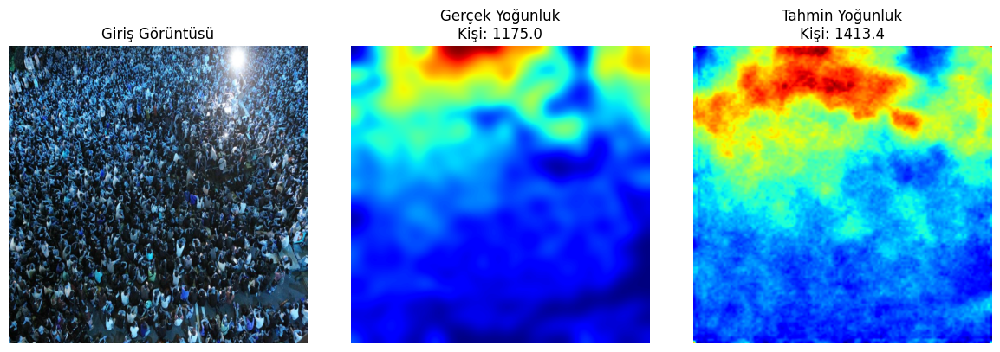

Difference:  -238.40771


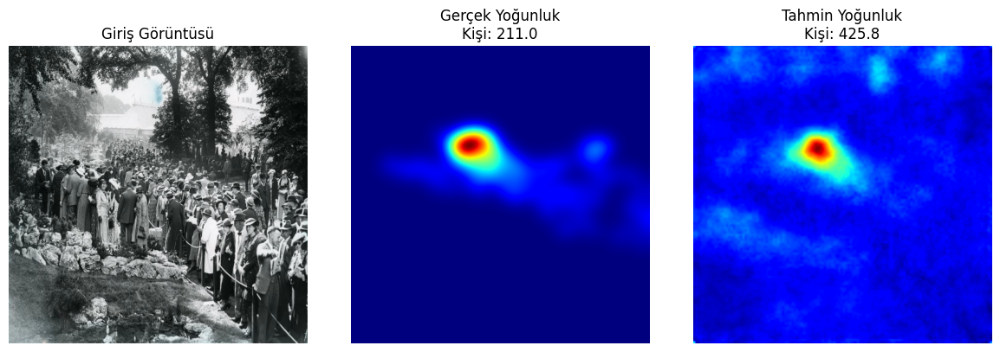

Difference:  -214.83728


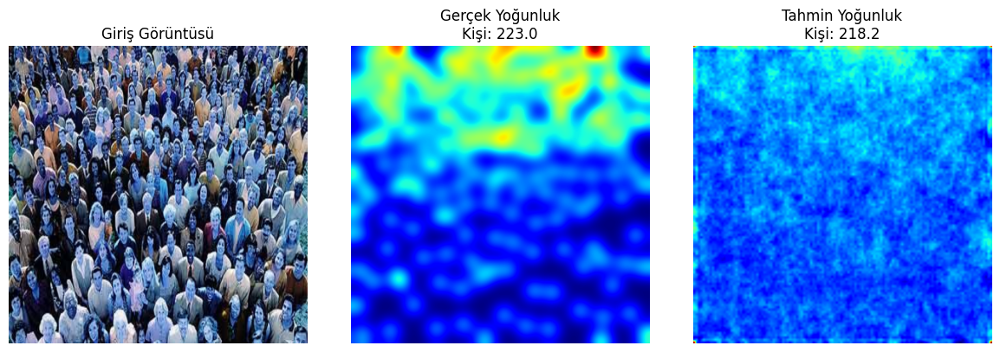

Difference:  4.834976


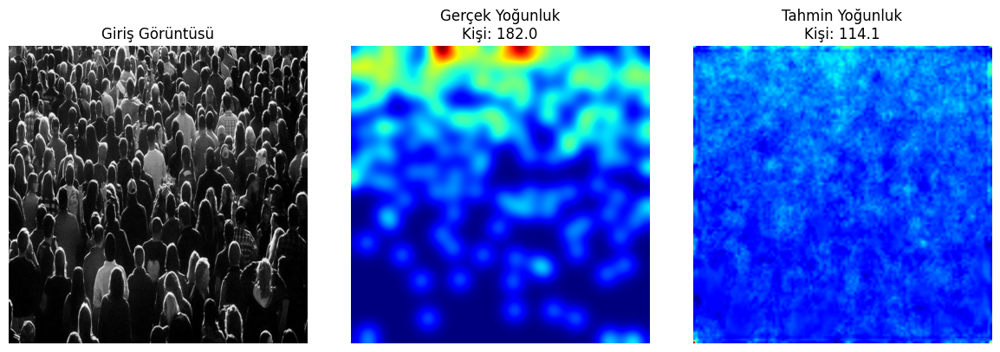

Difference:  67.908714


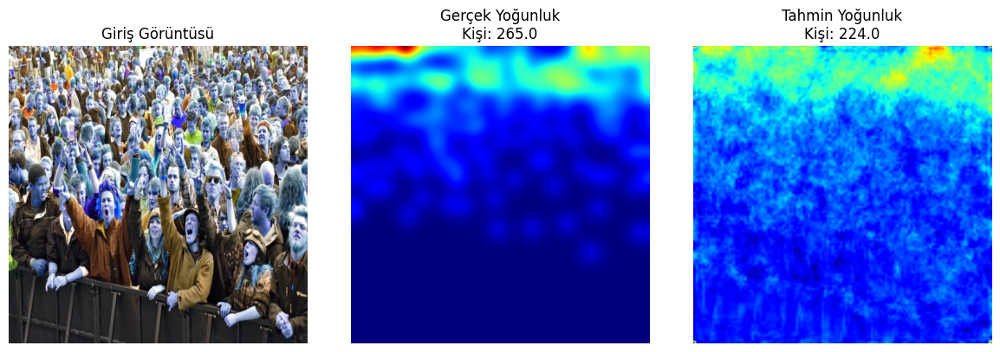

Difference:  41.01097


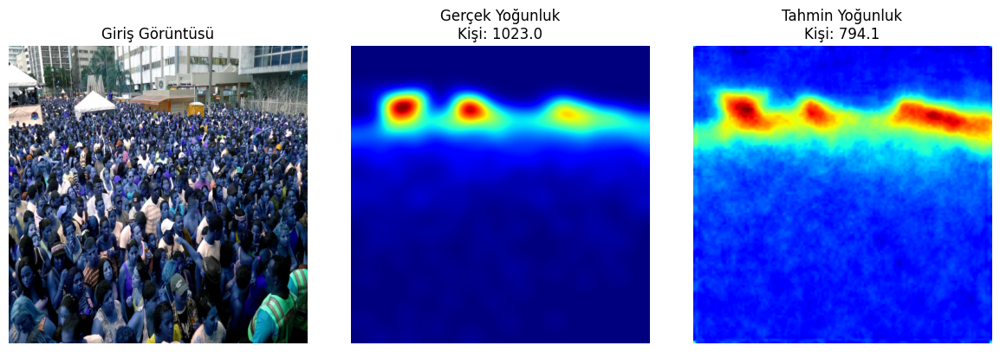

Difference:  228.85114


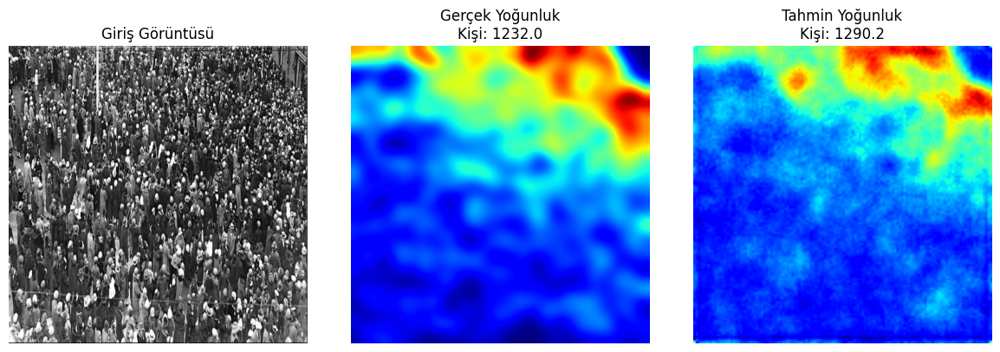

Difference:  -58.205444


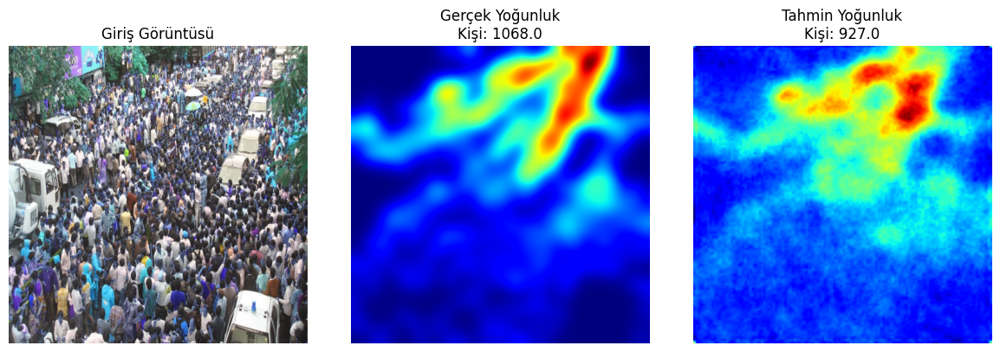

Difference:  140.95508


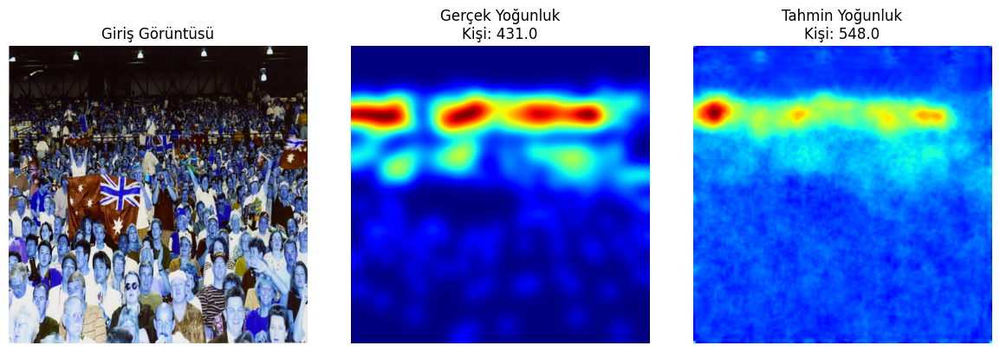

Difference:  -117.026184


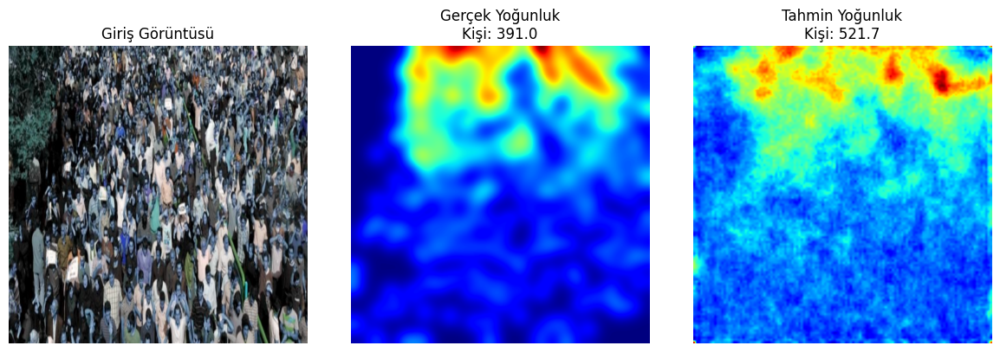

Difference:  -130.72476


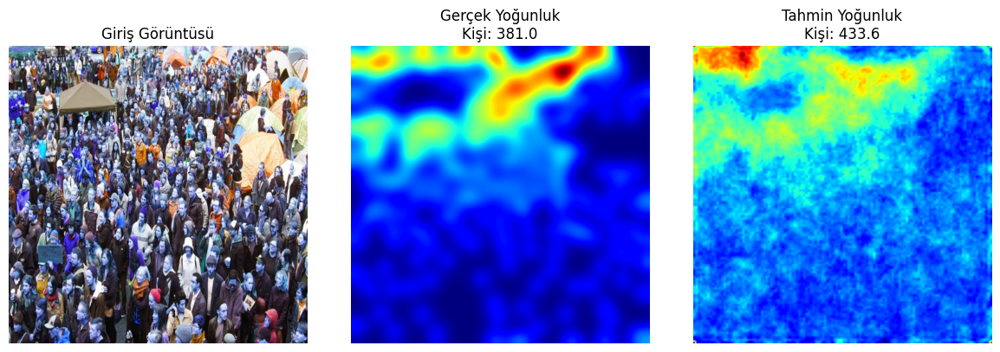

Difference:  -52.585297


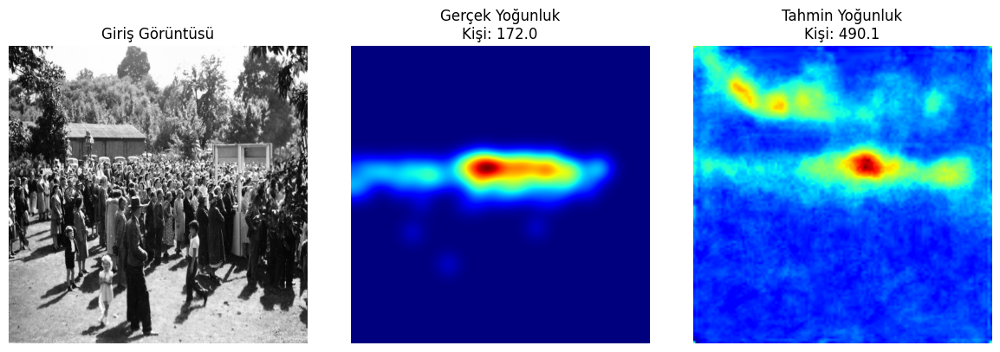

Difference:  -318.1497


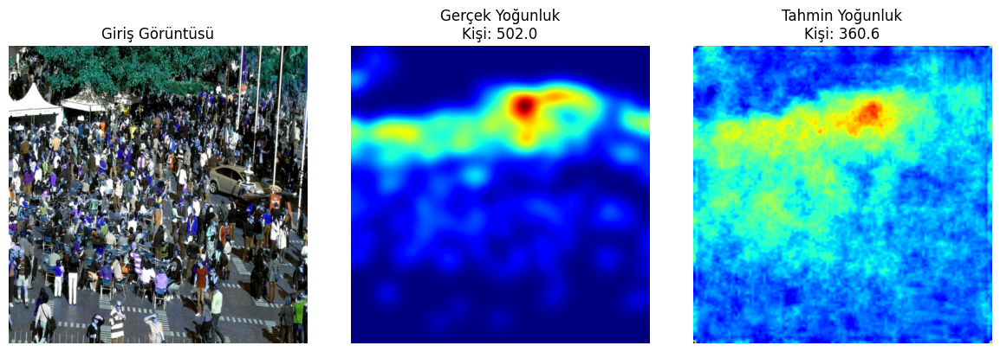

Difference:  141.42108


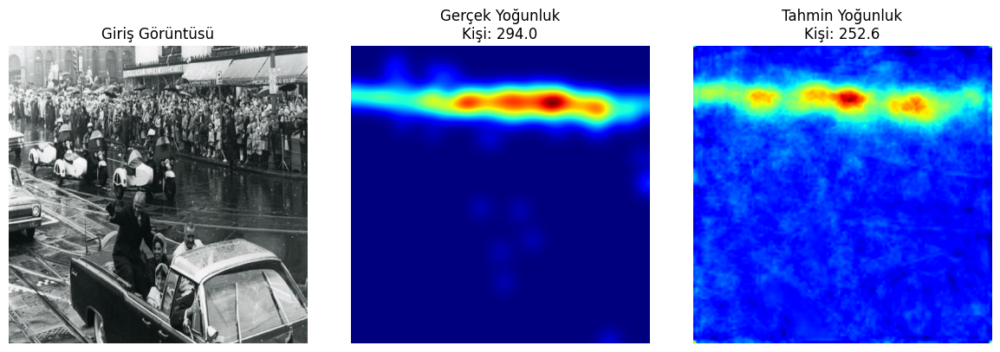

Difference:  41.377136


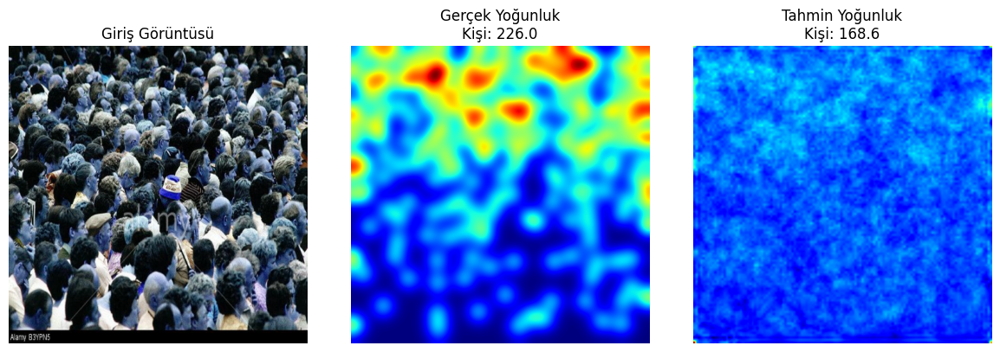

Difference:  57.42415


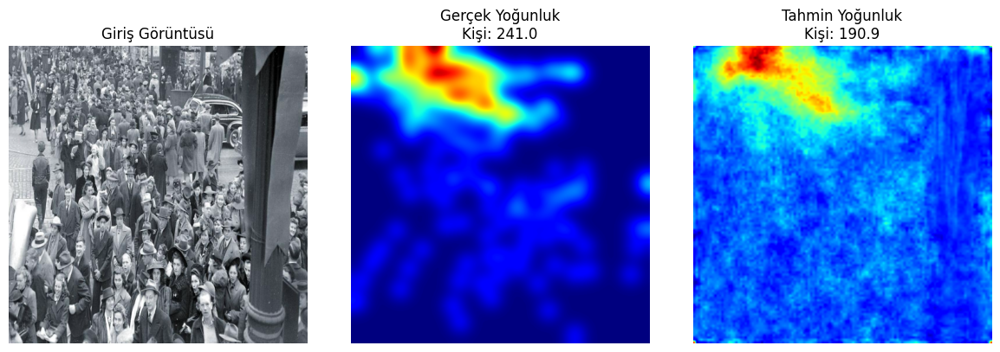

Difference:  50.12686


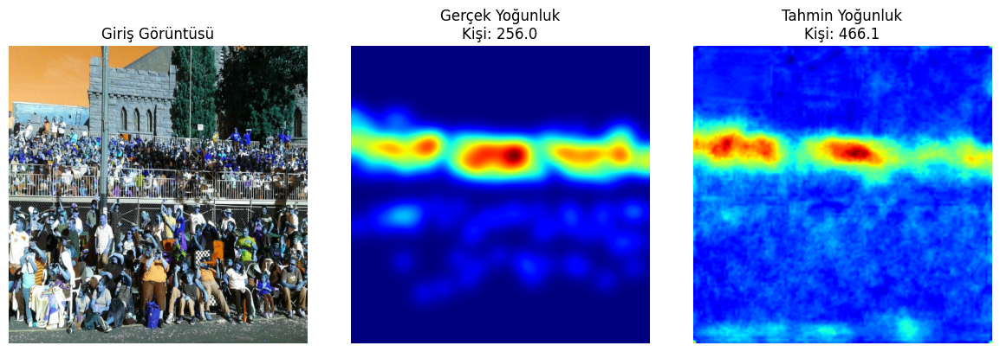

Difference:  -210.11737


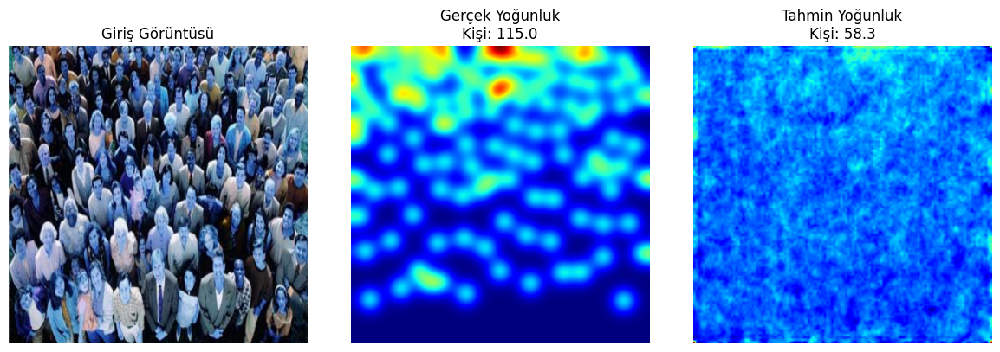

Difference:  56.674294


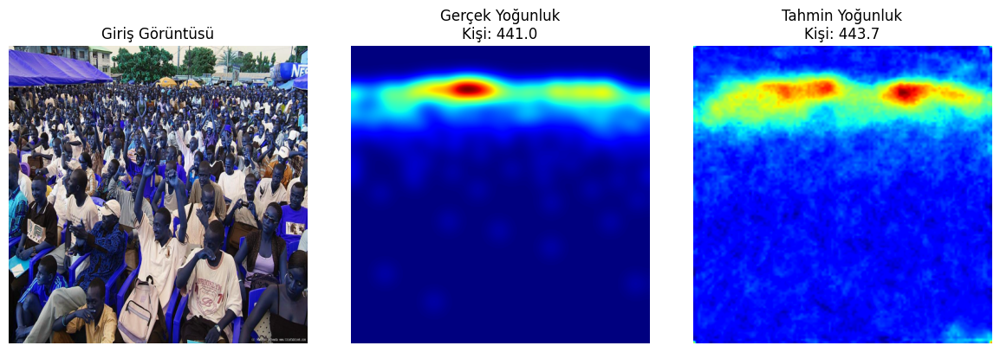

Difference:  -2.67453


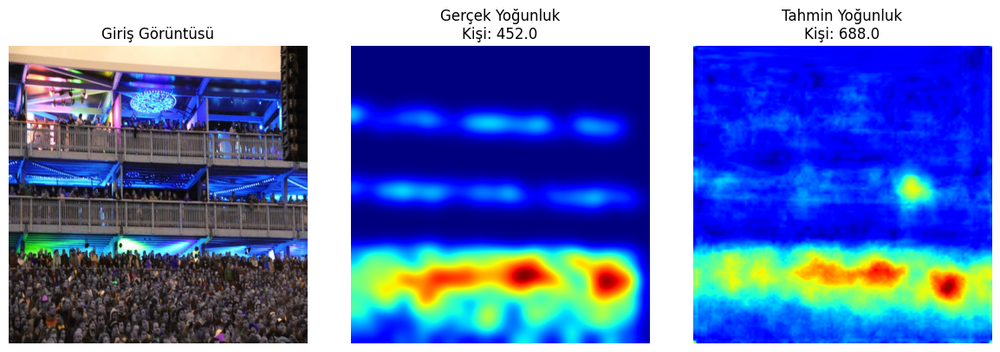

Difference:  -235.97043


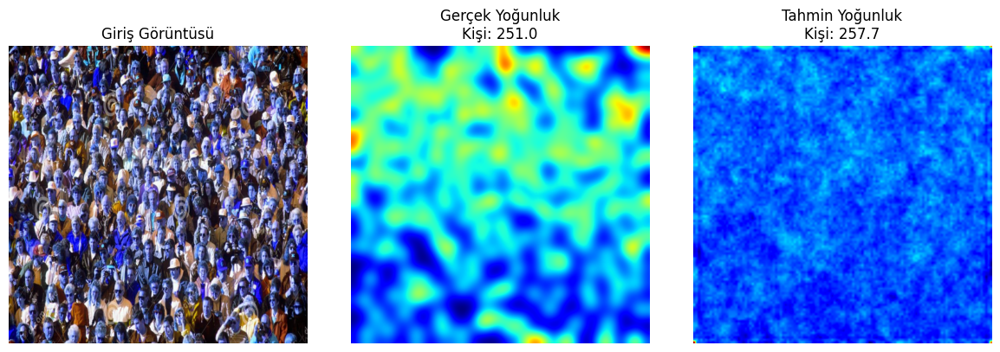

Difference:  -6.7268066


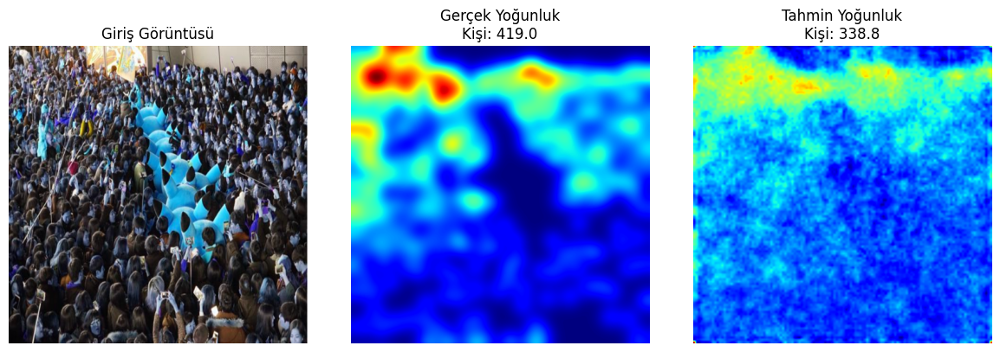

Difference:  80.17999


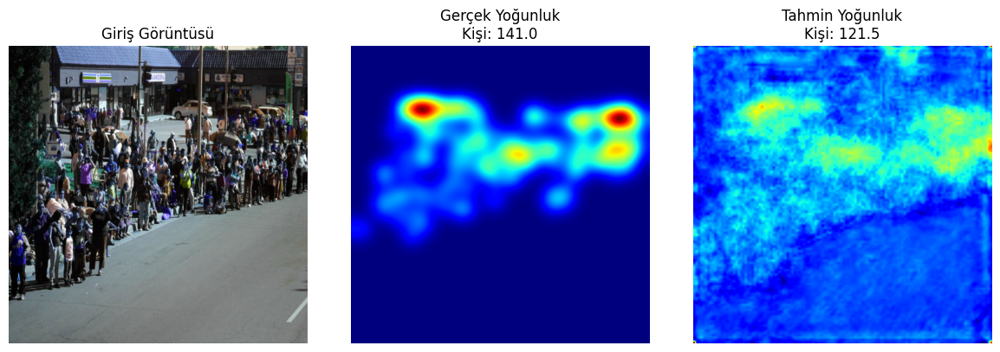

Difference:  19.528587


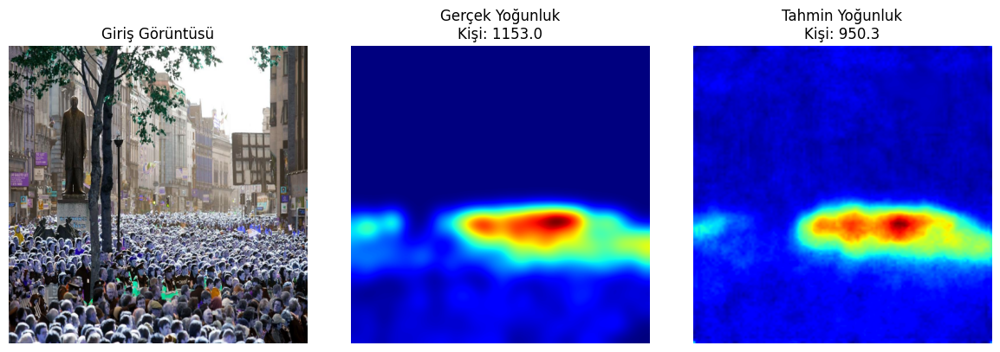

Difference:  202.70807


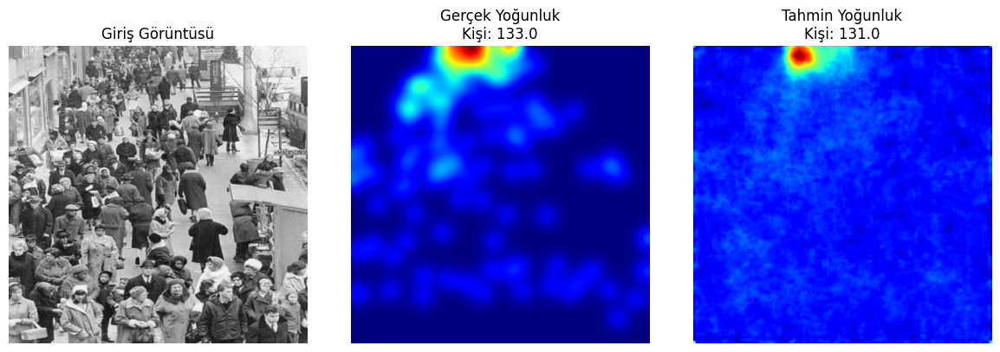

Difference:  1.9619446


In [ ]:
import torchvision.transforms.functional as TF

def visualize_predictions(model, dataloader, device, num_samples=5):
    model.eval()
    count = 0

    with torch.no_grad():
        for images, densities in dataloader:
            images = images.to(device)
            densities = densities.to(device)

            outputs = model(images)

            if outputs.shape[-2:] != densities.shape[-2:]:
                outputs = F.interpolate(outputs, size=densities.shape[-2:], mode='bilinear', align_corners=False)

            for i in range(images.size(0)):
                img = images[i].cpu()
                gt_density = densities[i].squeeze(0).cpu().numpy()
                pred_density = outputs[i].squeeze(0).cpu().numpy()

                gt_count = gt_density.sum()
                pred_count = pred_density.sum()
                fig, axs = plt.subplots(1, 3, figsize=(12, 4))

                axs[0].imshow(TF.to_pil_image(img))
                axs[0].set_title("Giriş Görüntüsü")
                axs[0].axis("off")

                axs[1].imshow(gt_density, cmap='jet')
                axs[1].set_title(f"Gerçek Yoğunluk\nKişi: {gt_count:.1f}")
                axs[1].axis("off")

                axs[2].imshow(pred_density, cmap='jet')
                axs[2].set_title(f"Tahmin Yoğunluk\nKişi: {pred_count:.1f}")
                axs[2].axis("off")

                plt.tight_layout()
                plt.show()
                print("Difference: ",gt_count-pred_count)
                count += 1
                if count >= num_samples:
                    return

visualize_predictions(model, test_loader, device, num_samples=25)